In [76]:
import pandas as pd

In [77]:
xls = pd.ExcelFile('df_radon_combined.xlsx')

In [78]:
xls.sheet_names 

['Geiger Box',
 'classRoom',
 '1',
 '2',
 '3',
 '4',
 '5',
 '7',
 '8',
 '9',
 '10',
 '11',
 '13',
 '15',
 '16',
 '17',
 '18',
 '19',
 '20',
 '21',
 '22',
 '23',
 '25',
 '26',
 '27',
 '28',
 '29',
 '30',
 '31',
 '32',
 '35',
 '36',
 '37',
 '39',
 '41',
 '43',
 '44',
 '45',
 '46',
 '48',
 '49',
 '50']

In [79]:
df = {}
for num in xls.sheet_names[2:]:
    df[num] = pd.read_excel(xls, num) 
    print(df[num].shape) 

(7546, 6)
(7365, 6)
(8993, 6)
(9182, 6)
(9234, 6)
(7539, 6)
(8937, 6)
(7715, 6)
(9234, 6)
(8940, 6)
(9332, 6)
(8726, 6)
(9063, 6)
(6082, 6)
(8957, 6)
(9092, 6)
(9218, 6)
(10739, 6)
(8909, 6)
(7703, 6)
(9136, 6)
(8175, 6)
(7176, 6)
(8803, 6)
(9101, 6)
(8957, 6)
(8964, 6)
(9058, 6)
(9050, 6)
(6916, 6)
(9001, 6)
(9035, 6)
(8106, 6)
(8999, 6)
(1579, 6)
(9320, 6)
(9101, 6)
(7524, 6)
(9098, 6)
(8960, 6)


In [80]:
#remove these indexes
devices = ['1', '2', '5', '9', '17', '23', '27', '28', '36', '44', '48']
for key in list(df):
    if key in devices:
        del df[key]

In [81]:
for key in df:
    print(key)
    print(df[key].shape)
    df[key]['SyncDate'] = pd.to_datetime(df[key]['SyncDate'])
    print(f"{df[key]['SyncDate'].min()} - {df[key]['SyncDate'].max()}")
    df[key].sort_values(by='SyncDate', ascending=True, inplace=True)
    df[key]['SyncDate'] = df[key]['SyncDate'].dt.floor('H')
    df[key] = df[key].resample('H', on = 'SyncDate').mean()
    df[key] = df[key].interpolate(method='linear', limit_direction='both')
    start_time = pd.to_datetime('2022-05-11T18:29:00.000000000')
    end_time = pd.to_datetime('2023-06-06T12:00:00.000000000')
    df[key] = df[key][(df[key].index >= start_time) & (df[key].index <= end_time)]
    print(f"{df[key].index.min()} - {df[key].index.max()}")

3
(8993, 6)
2022-05-08 00:16:30 - 2023-06-06 12:25:38
2022-05-11 19:00:00 - 2023-06-06 12:00:00
4
(9182, 6)
2022-05-08 00:17:23 - 2023-06-06 12:26:06
2022-05-11 19:00:00 - 2023-06-06 12:00:00
7
(7539, 6)
2022-04-01 10:18:57 - 2023-06-06 12:30:25
2022-05-11 19:00:00 - 2023-06-06 12:00:00
8
(8937, 6)
2022-04-04 18:52:46 - 2023-06-06 12:27:12
2022-05-11 19:00:00 - 2023-06-06 12:00:00
10
(9234, 6)
2022-05-08 00:56:00 - 2023-06-06 23:02:00
2022-05-11 19:00:00 - 2023-06-06 12:00:00
11
(8940, 6)
2022-05-08 00:50:01 - 2023-06-07 12:13:32
2022-05-11 19:00:00 - 2023-06-06 12:00:00
13
(9332, 6)
2022-05-08 00:33:33 - 2023-06-06 23:09:00
2022-05-11 19:00:00 - 2023-06-06 12:00:00
15
(8726, 6)
2022-05-08 00:39:00 - 2023-06-06 23:59:00
2022-05-11 19:00:00 - 2023-06-06 12:00:00
16
(9063, 6)
2022-05-08 00:47:00 - 2023-06-06 23:00:00
2022-05-11 19:00:00 - 2023-06-06 12:00:00
18
(8957, 6)
2022-05-08 00:49:00 - 2023-06-06 23:07:00
2022-05-11 19:00:00 - 2023-06-06 12:00:00
19
(9092, 6)
2022-05-08 00:51:00 -

In [82]:
 df_radon = pd.DataFrame(index=df['50'].index)

In [83]:
for key in df:
    print(key)
    df_radon[f'Radon_{key}'] = df[key]['Radon']

3
4
7
8
10
11
13
15
16
18
19
20
21
22
25
26
29
30
31
32
35
37
39
41
43
45
46
49
50


In [84]:
df_radon = df_radon.T

In [85]:
from dtaidistance import dtw
ds = dtw.distance_matrix_fast(df_radon.values, parallel = True)

In [86]:
ds

array([[   0.        , 1151.12515774,  915.26762497,  743.58844666,
        1751.67241556, 1087.4691137 ,  557.32266784,  861.43298252,
        1608.17212299, 1561.18898308,  717.26610427,  525.76620995,
         749.24405101, 2807.48428445, 1102.98195507, 1220.32085107,
         792.757958  ,  782.49364278,  896.10281924,  579.45710344,
        1068.83888999,  881.81694145, 1524.28711176,  875.00561793,
         789.85401096,  525.03948374, 1236.65350762, 1176.93570846,
        1634.65990013],
       [1151.12515774,    0.        , 2597.3139419 , 1912.94430364,
        3750.03061355,  847.35382628, 1374.51256403, 1848.46359793,
        3567.28792658, 3507.76221635, 1939.14178436, 1483.49829168,
        1822.715569  , 1811.46266852, 2873.36759151, 1198.48386201,
        1309.89223628, 1116.59137453, 2538.61880764, 1652.93775851,
        2785.43401309, 2493.17672551, 3457.09221021, 2488.77707932,
        1862.59277192, 1118.63387428, 1132.90829707, 2989.76123487,
        1243.30418965],


In [87]:
ds = pd.DataFrame(ds, index = df_radon.index, columns=df_radon.index)

In [88]:
max_ds = ds.max().max()
ds = (max_ds - ds)/max_ds

In [89]:
ds

,Radon_3,Radon_4,Radon_7,Radon_8,Radon_10,Radon_11,Radon_13,Radon_15,Radon_16,Radon_18,...,Radon_32,Radon_35,Radon_37,Radon_39,Radon_41,Radon_43,Radon_45,Radon_46,Radon_49,Radon_50
Radon_3,1.000000,0.743141,0.795770,0.834078,0.609136,0.757345,0.875640,0.807782,0.641157,0.651640,...,0.870701,0.761502,0.803234,0.659874,0.804753,0.823754,0.882844,0.724056,0.737382,0.635246
Radon_4,0.743141,1.000000,0.420442,0.573150,0.163228,0.810924,0.693295,0.587539,0.204004,0.217287,...,0.631168,0.378465,0.443679,0.228593,0.444661,0.584386,0.750391,0.747206,0.332872,0.722572
Radon_7,0.795770,0.420442,1.000000,0.896481,0.961864,0.519197,0.823178,0.846822,0.967194,0.968351,...,0.890544,0.957534,0.958513,0.969802,0.965886,0.904504,0.723418,0.449819,0.970638,0.402387
Radon_8,0.834078,0.573150,0.896481,1.000000,0.734442,0.653269,0.870787,0.908155,0.772368,0.783942,...,0.910395,0.895088,0.912262,0.792654,0.896001,0.937851,0.823304,0.621420,0.852159,0.562082
Radon_10,0.609136,0.163228,0.961864,0.734442,1.000000,0.272689,0.732554,0.642150,0.989150,0.989116,...,0.820825,0.909559,0.868203,0.980210,0.886764,0.835147,0.491674,0.220282,0.960936,0.145772
Radon_11,0.757345,0.810924,0.519197,0.653269,0.272689,1.000000,0.743220,0.666379,0.314269,0.327655,...,0.693335,0.484450,0.545842,0.340307,0.538484,0.658454,0.792771,0.773873,0.439950,0.755311
Radon_13,0.875640,0.693295,0.823178,0.870787,0.732554,0.743220,1.000000,0.872031,0.757643,0.764971,...,0.906049,0.823457,0.840919,0.769996,0.831686,0.875843,0.873263,0.719472,0.811066,0.631959
Radon_15,0.807782,0.587539,0.846822,0.908155,0.642150,0.666379,0.872031,1.000000,0.685002,0.700105,...,0.882036,0.832844,0.864181,0.710535,0.853577,0.906585,0.828297,0.669571,0.799881,0.605824
Radon_16,0.641157,0.204004,0.967194,0.772368,0.989150,0.314269,0.757643,0.685002,1.000000,0.990300,...,0.841094,0.924889,0.896679,0.985507,0.905592,0.856756,0.534364,0.258142,0.967489,0.186402
Radon_18,0.651640,0.217287,0.968351,0.783942,0.989116,0.327655,0.764971,0.700105,0.990300,1.000000,...,0.846894,0.928683,0.906229,0.983514,0.909137,0.862663,0.546829,0.268876,0.968685,0.201276


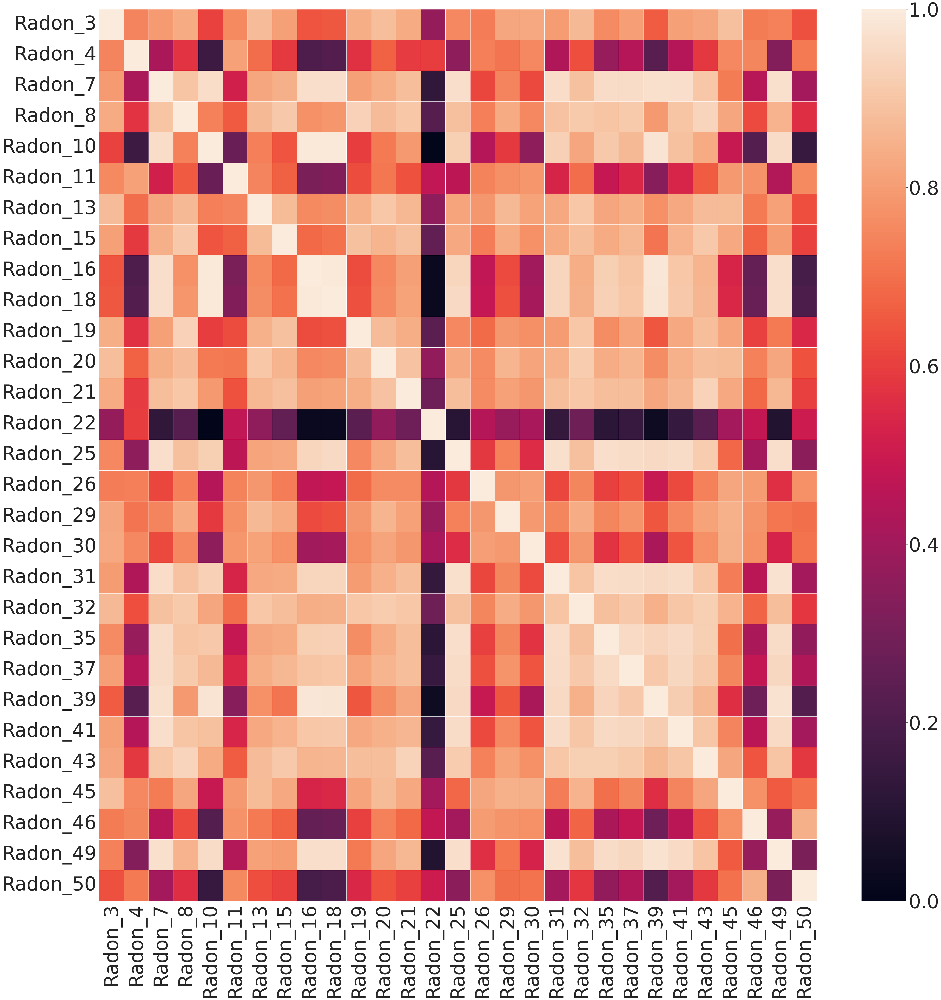

In [90]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(rc={'figure.figsize':(60,60)})
sns.set(font_scale=6.5)
sns.heatmap(ds, linewidths=.5, xticklabels=ds.index, yticklabels=ds.columns)
plt.xticks(rotation=90)
plt.savefig('heatmap.png', bbox_inches='tight')

In [91]:
A_adj_6 = ds > 0.8

In [92]:
for i in A_adj_6.columns:
    A_adj_6[i][i] = False
# for i in A_adj_7.columns:
#     A_adj_7[i][i] = False

In [70]:
ds_copy = ds.copy()
for i in ds_copy.columns:
    ds_copy[i][i] = 0

In [93]:
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
g6 = nx.from_pandas_adjacency(A_adj_6)

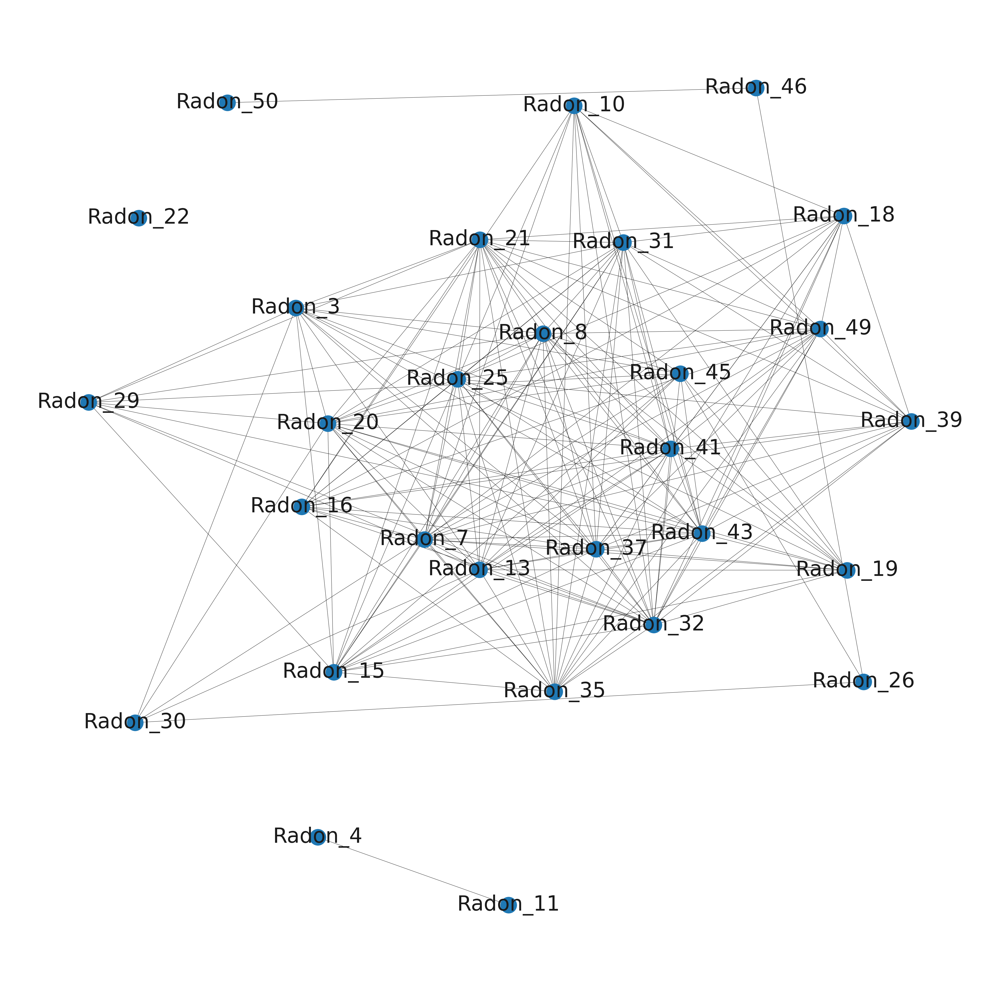

In [100]:
plt.rcParams = plt.rcParamsOrig
fig, ax2 = plt.subplots(1, 1, figsize=(60,60))
ax2.set_facecolor('white')
nx.draw_networkx(g6, font_size=70, node_size=3000, ax=ax2, width = 1, with_labels=True, pos = nx.spring_layout(g6, k=2))
fig.savefig('spatial_similarity_8', bbox_inches='tight')

In [95]:
from networkx.algorithms import community
communities_label_propagation = community.label_propagation_communities(g6)
communities_louvain = community.greedy_modularity_communities(g6)
print("--------------------------------------------------------")
for i, community in enumerate(communities_label_propagation):
    print(f"Community {i+1}: {community}")
print("----------------------------------------------------------")
for i, community in enumerate(communities_louvain):
    print(f"Community {i+1}: {community}")

--------------------------------------------------------
Community 1: {'Radon_8', 'Radon_26', 'Radon_19', 'Radon_29', 'Radon_13', 'Radon_45', 'Radon_25', 'Radon_18', 'Radon_10', 'Radon_20', 'Radon_39', 'Radon_16', 'Radon_3', 'Radon_32', 'Radon_15', 'Radon_37', 'Radon_43', 'Radon_41', 'Radon_21', 'Radon_30', 'Radon_49', 'Radon_31', 'Radon_35', 'Radon_7'}
Community 2: {'Radon_11', 'Radon_4'}
Community 3: {'Radon_22'}
Community 4: {'Radon_50', 'Radon_46'}
----------------------------------------------------------
Community 1: frozenset({'Radon_10', 'Radon_39', 'Radon_31', 'Radon_16', 'Radon_32', 'Radon_49', 'Radon_37', 'Radon_25', 'Radon_43', 'Radon_35', 'Radon_18', 'Radon_41', 'Radon_7'})
Community 2: frozenset({'Radon_8', 'Radon_26', 'Radon_20', 'Radon_21', 'Radon_46', 'Radon_30', 'Radon_19', 'Radon_29', 'Radon_3', 'Radon_13', 'Radon_45', 'Radon_15', 'Radon_50'})
Community 3: frozenset({'Radon_11', 'Radon_4'})
Community 4: frozenset({'Radon_22'})


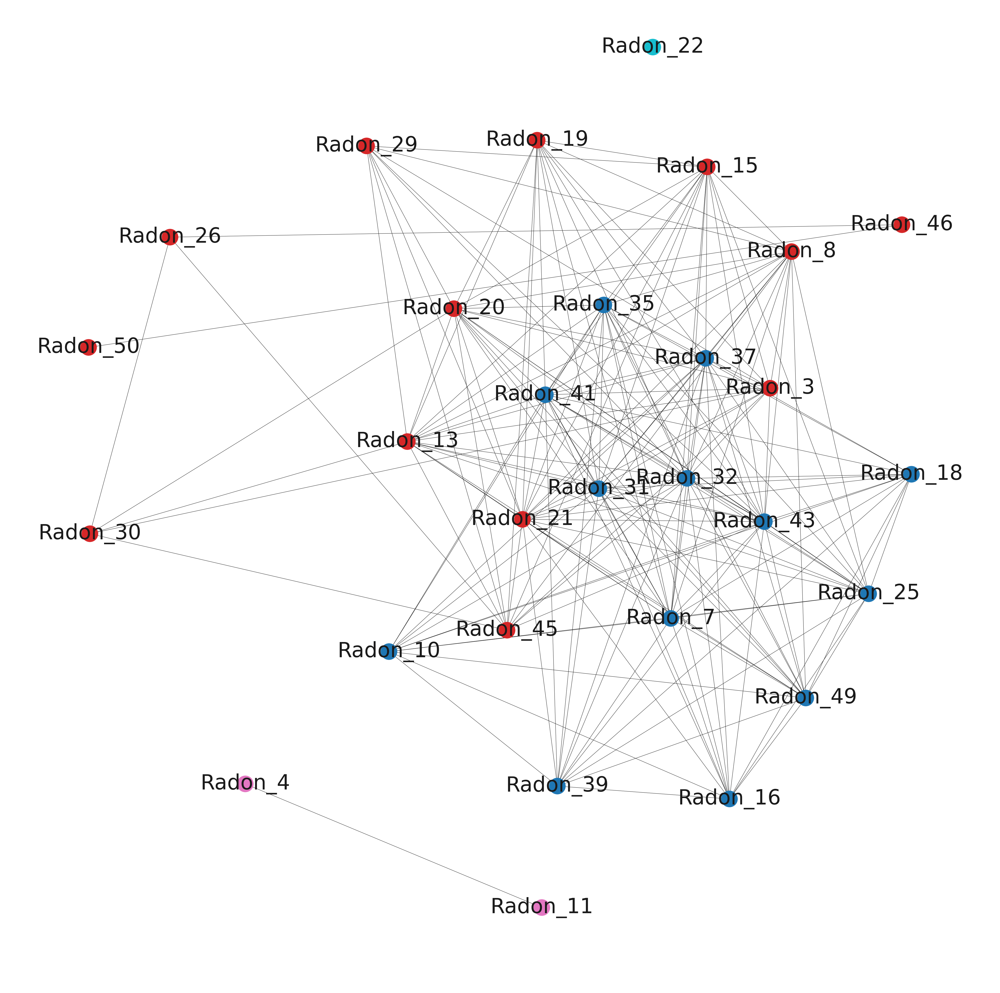

In [98]:
color_map = {}
for i, comm in enumerate(communities_louvain):
    for node in comm:
        color_map[node] = i

#draw the graph
plt.rcParams = plt.rcParamsOrig
fig, ax2 = plt.subplots(1, 1, figsize=(60,60))
ax2.set_facecolor('white')
pos = nx.spring_layout(g6, k=2)
nx.draw_networkx_nodes(g6, pos, node_color=[color_map[node] for node in g6.nodes()], cmap='tab10', ax=ax2, node_size=3000,)
nx.draw_networkx_edges(g6, pos, ax=ax2)
nx.draw_networkx_labels(g6, pos, ax=ax2, font_size=70,)
ax2.axis('off')
fig.savefig('spatial_similarity_louvain', bbox_inches='tight')

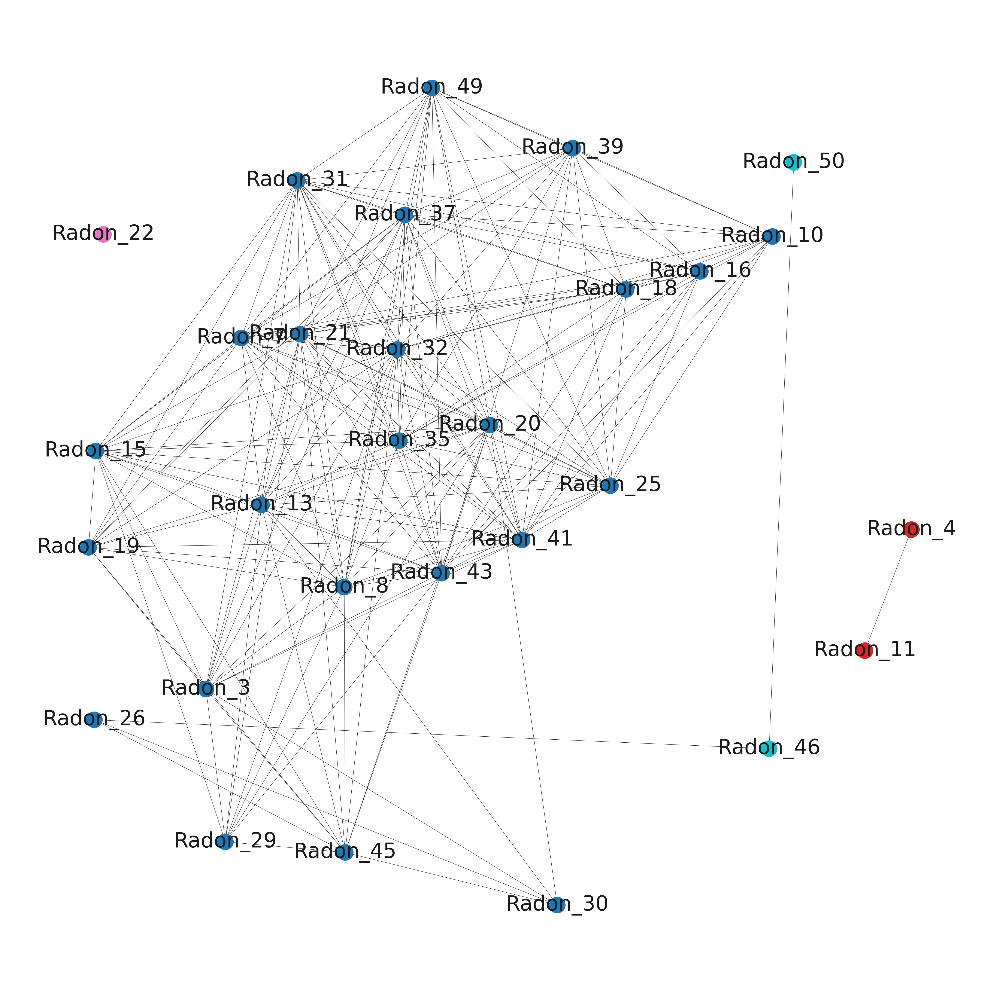

In [99]:
color_map = {}
for i, comm in enumerate(communities_label_propagation):
    for node in comm:
        color_map[node] = i

#draw the graph
plt.rcParams = plt.rcParamsOrig
fig, ax2 = plt.subplots(1, 1, figsize=(60,60))
ax2.set_facecolor('white')
pos = nx.spring_layout(g6, k=2)
nx.draw_networkx_nodes(g6, pos, node_color=[color_map[node] for node in g6.nodes()], cmap='tab10', ax=ax2, node_size=3000,)
nx.draw_networkx_edges(g6, pos, ax=ax2)
nx.draw_networkx_labels(g6, pos, ax=ax2, font_size=70,)
ax2.axis('off')
fig.savefig('spatial_similarity_label_propagation', bbox_inches='tight')